本文将继续在rumi_strategy开发过程中,将遇到的几种业绩评价指标进行开发.

传统的业绩指标有年化收益率, 最大回撤, Sharpe Ratio等等.

这些指标受回撤时间段的影响很大, 同样的交易策略在不同时间段优化后得到的最优参数组往往会有较大变化,具体可以查看知乎文章【Elite量化策略实验室】RUMI策略2的内容.

为了减小不同时间段的优化差异, 柯蒂斯提出了Regressed Annual Return指标, R Cubed指标, 以及Robust Sharpe Ratio指标.

本文将对上述三种指标,基于VeighNa Trader社区开源版进行复现.

为了后续开发的便捷, 新的评价指标将以继承 vnpy_ctastrategy.backtesting.BacktestingEngine 的形式覆写.

# 下一格代码放至backtesting_engine_new_statistics.py

In [ ]:
from pandas import DataFrame
from statsmodels.api import OLS
import statsmodels.api as sm
from pandas import Series
import numpy as np
from datetime import date, datetime, timedelta
from typing import List, Dict

from vnpy_ctastrategy.backtesting import (BacktestingEngine, 
                                          CtaTemplate, 
                                          Interval, 
                                          BacktestingMode,
                                          OptimizationSetting,
                                          check_optimization_setting,
                                          run_bf_optimization,
                                          run_ga_optimization,
                                          get_target_value,
                                          partial)

class BacktestingEngineNewStatistics(BacktestingEngine):
    """"""
    def __init__(self):
        super().__init__()
        self.ddpercent_only: bool = True # 用于控制计算R_cubed参数时, 是否考虑回撤周期长度的布尔开关.

    def calculate_statistics(self, df: DataFrame = None, output=True) -> dict:
        self.output("开始计算策略统计指标")

        # Check DataFrame input exterior
        if df is None:
            df: DataFrame = self.daily_df

        # Init all statistics default value
        start_date: str = ""
        end_date: str = ""
        total_days: int = 0
        profit_days: int = 0
        loss_days: int = 0
        end_balance: float = 0
        max_drawdown: float = 0
        max_ddpercent: float = 0
        max_drawdown_duration: int = 0
        total_net_pnl: float = 0
        daily_net_pnl: float = 0
        total_commission: float = 0
        daily_commission: float = 0
        total_slippage: float = 0
        daily_slippage: float = 0
        total_turnover: float = 0
        daily_turnover: float = 0
        total_trade_count: int = 0
        daily_trade_count: int = 0
        total_return: float = 0
        annual_return: float = 0
        daily_return: float = 0
        return_std: float = 0
        sharpe_ratio: float = 0
        return_drawdown_ratio: float = 0
        regressed_annual_return: float = 0
        r_cubed: float = 0
        robust_sharpe_ratio: float = 0
        # Check if balance is always positive
        positive_balance: bool = False

        if df is not None:
            # Calculate balance related time series data
            df["balance"] = df["net_pnl"].cumsum() + self.capital
            # When balance falls below 0, set daily return to 0
            pre_balance: Series = df["balance"].shift(1)
            pre_balance.iloc[0] = self.capital
            x = df["balance"] / pre_balance
            x[x <= 0] = np.nan
            df["return"] = np.log(x).fillna(0)

            df["highlevel"] = (
                df["balance"].rolling(
                    min_periods=1, window=len(df), center=False).max()
            )
            df["drawdown"] = df["balance"] - df["highlevel"]
            df["ddpercent"] = df["drawdown"] / df["highlevel"] * 100

            # 添加部分 calculate regressed_annual_return
            # df["cumreturn"] = (df["balance"] / self.capital - 1) * 100
            df["cumreturn"] = df["return"].expanding(1).sum() * 100


            
            # All balance value needs to be positive
            positive_balance = (df["balance"] > 0).all()
            if not positive_balance:
                self.output("回测中出现爆仓（资金小于等于0），无法计算策略统计指标")

        # Calculate statistics value
        if positive_balance:
            # Calculate statistics value
            start_date = df.index[0]
            end_date = df.index[-1]

            total_days: int = len(df)
            profit_days: int = len(df[df["net_pnl"] > 0])
            loss_days: int = len(df[df["net_pnl"] < 0])

            end_balance = df["balance"].iloc[-1]
            max_drawdown = df["drawdown"].min()
            max_ddpercent = df["ddpercent"].min()
            max_drawdown_end = df["drawdown"].idxmin()

            if isinstance(max_drawdown_end, date):
                max_drawdown_start = df["balance"][:max_drawdown_end].idxmax()
                max_drawdown_duration: int = (max_drawdown_end - max_drawdown_start).days
            else:
                max_drawdown_duration: int = 0

            total_net_pnl: float = df["net_pnl"].sum()
            daily_net_pnl: float = total_net_pnl / total_days

            total_commission: float = df["commission"].sum()
            daily_commission: float = total_commission / total_days

            total_slippage: float = df["slippage"].sum()
            daily_slippage: float = total_slippage / total_days

            total_turnover: float = df["turnover"].sum()
            daily_turnover: float = total_turnover / total_days

            total_trade_count: int = df["trade_count"].sum()
            daily_trade_count: int = total_trade_count / total_days

            total_return: float = (end_balance / self.capital - 1) * 100
            annual_return: float = total_return / total_days * self.annual_days
            daily_return: float = df["return"].mean() * 100
            return_std: float = df["return"].std() * 100

            if return_std:
                daily_risk_free: float = self.risk_free / np.sqrt(self.annual_days)
                sharpe_ratio: float = (daily_return - daily_risk_free) / return_std * np.sqrt(self.annual_days)
            else:
                sharpe_ratio: float = 0

            if max_ddpercent:
                return_drawdown_ratio: float = -total_return / max_ddpercent
            else:
                return_drawdown_ratio = 0

            # 计算regressed_annual_return
            regressed_annual_return = calculate_regressed_annual_return(df, self.annual_days)
            # 计算各阶段回撤 calculate period dropdowns
            dropdowns = find_periodic_dropdowns(df)
            # 计算r-cubed指标
            r_cubed = calculate_r_cubed(dropdowns, regressed_annual_return, self.ddpercent_only)
            # 计算robust_sharpe_ratio
            robust_sharpe_ratio = regressed_annual_return / (return_std * np.sqrt(self.annual_days))
        
        
        # Output
        if output:
            self.output("-" * 30)
            self.output(f"首个交易日：\t{start_date}")
            self.output(f"最后交易日：\t{end_date}")

            self.output(f"总交易日：\t{total_days}")
            self.output(f"盈利交易日：\t{profit_days}")
            self.output(f"亏损交易日：\t{loss_days}")

            self.output(f"起始资金：\t{self.capital:,.2f}")
            self.output(f"结束资金：\t{end_balance:,.2f}")

            self.output(f"总收益率：\t{total_return:,.2f}%")
            self.output(f"年化收益：\t{annual_return:,.2f}%")
            self.output(f"最大回撤: \t{max_drawdown:,.2f}")
            self.output(f"百分比最大回撤: {max_ddpercent:,.2f}%")
            self.output(f"最长回撤天数: \t{max_drawdown_duration}")

            self.output(f"总盈亏：\t{total_net_pnl:,.2f}")
            self.output(f"总手续费：\t{total_commission:,.2f}")
            self.output(f"总滑点：\t{total_slippage:,.2f}")
            self.output(f"总成交金额：\t{total_turnover:,.2f}")
            self.output(f"总成交笔数：\t{total_trade_count}")

            self.output(f"日均盈亏：\t{daily_net_pnl:,.2f}")
            self.output(f"日均手续费：\t{daily_commission:,.2f}")
            self.output(f"日均滑点：\t{daily_slippage:,.2f}")
            self.output(f"日均成交金额：\t{daily_turnover:,.2f}")
            self.output(f"日均成交笔数：\t{daily_trade_count}")

            self.output(f"日均收益率：\t{daily_return:,.2f}%")
            self.output(f"收益标准差：\t{return_std:,.2f}%")
            self.output(f"Sharpe Ratio：\t{sharpe_ratio:,.2f}")
            self.output(f"收益回撤比：\t{return_drawdown_ratio:,.2f}")
            self.output(f"Regressed Annual Return: \t {regressed_annual_return:,.4f}")
            self.output(f"R-cubed Ratio: \t{r_cubed:,.4f}")
            self.output(f"Robust Sharpe Ratio: \t{robust_sharpe_ratio:,.4f}")

        statistics: dict = {
            "start_date": start_date,
            "end_date": end_date,
            "total_days": total_days,
            "profit_days": profit_days,
            "loss_days": loss_days,
            "capital": self.capital,
            "end_balance": end_balance,
            "max_drawdown": max_drawdown,
            "max_ddpercent": max_ddpercent,
            "max_drawdown_duration": max_drawdown_duration,
            "total_net_pnl": total_net_pnl,
            "daily_net_pnl": daily_net_pnl,
            "total_commission": total_commission,
            "daily_commission": daily_commission,
            "total_slippage": total_slippage,
            "daily_slippage": daily_slippage,
            "total_turnover": total_turnover,
            "daily_turnover": daily_turnover,
            "total_trade_count": total_trade_count,
            "daily_trade_count": daily_trade_count,
            "total_return": total_return,
            "annual_return": annual_return,
            "daily_return": daily_return,
            "return_std": return_std,
            "sharpe_ratio": sharpe_ratio,
            "return_drawdown_ratio": return_drawdown_ratio,
            "regressed_annual_return": regressed_annual_return,
            "r_cubed_ratio": r_cubed,
            "robust_sharpe_ratio": robust_sharpe_ratio,
        }
        # Filter potential error infinite value
        for key, value in statistics.items():
            if value in (np.inf, -np.inf):
                value = 0
            statistics[key] = np.nan_to_num(value)

        self.output("策略统计指标计算完成")
        
        return statistics

    def run_bf_optimization(
        self,
        optimization_setting: OptimizationSetting,
        output: bool = True,
        max_workers: int = None
    ) -> list:
        """"""
        if not check_optimization_setting(optimization_setting):
            return

        evaluate_func: callable = wrap_evaluate(self, optimization_setting.target_name)
        results: list = run_bf_optimization(
            evaluate_func,
            optimization_setting,
            get_target_value,
            max_workers=max_workers,
            output=self.output
        )

        if output:
            for result in results:
                msg: str = f"参数：{result[0]}, 目标：{result[1]}"
                self.output(msg)

        return results

    run_optimization = run_bf_optimization

    def run_ga_optimization(
        self,
        optimization_setting: OptimizationSetting,
        output: bool = True,
        max_workers: int = None
    ) -> list:
        """"""
        if not check_optimization_setting(optimization_setting):
            return

        evaluate_func: callable = wrap_evaluate(self, optimization_setting.target_name)
        results: list = run_ga_optimization(
            evaluate_func,
            optimization_setting,
            get_target_value,
            max_workers=max_workers,
            output=self.output
        )

        if output:
            for result in results:
                msg: str = f"参数：{result[0]}, 目标：{result[1]}"
                self.output(msg)

        return results


def calculate_regressed_annual_return(df: DataFrame, annual_days) -> float:
    """计算regressed_annual_return"""
    X = np.linspace(1, len(df), len(df))
    # 回归方程不需要添加常数项, 以y=ax为模型
    Y1 = df["cumreturn"].values
    model1 = OLS(Y1, X)
    result1 = model1.fit()
    # annualise fitted return 
    regressed_annual_return = result1.params[0] * annual_days
    return regressed_annual_return

def calculate_r_cubed(dropdowns: List[Dict], regressed_annual_return: float, ddpercent_only: bool) -> float:
    # 回测中有出现净值不断下跌的情况, 此时dropdowns会是个空值列表
    if dropdowns:
        dropdowns_sorted = sorted(dropdowns, key = lambda x:x["max_ddpercent"])
        if len(dropdowns_sorted)  > 4:
            top_dropdowns_sorted = dropdowns_sorted[:5]
        else:
            top_dropdowns_sorted = dropdowns_sorted
        top_max_dropdown_percents = [i["max_ddpercent"] for i in top_dropdowns_sorted]
        top_max_dropdown_lengths = [i["max_ddpercent_length"] for i in top_dropdowns_sorted]
        # 公式计算r-cubed
        # 由于计算dropdown_length使用的是自然日, 则年化需要用365/年的常数.
        average_top_dropdowns = abs(np.mean(top_max_dropdown_percents))
        average_top_dropdowns_length = np.mean(top_max_dropdown_lengths)
        
        if not ddpercent_only:
            # 计算RAR/top平均回撤/top回撤时间*365天年化
            r_cubed = regressed_annual_return * 365 / average_top_dropdowns / average_top_dropdowns_length
        else:
            # 只计算RAR/前N词平均回撤
            r_cubed = regressed_annual_return / average_top_dropdowns
    else: 
        r_cubed = 0.0

    return r_cubed

def find_periodic_dropdowns(df: DataFrame) -> List[Dict[str, float]]:
    dropdowns = []
    current_dropdown = None

    for index, row in df.iterrows():
        ddpercent = row['ddpercent']

        if not current_dropdown and ddpercent < 0:
            # 新建一个 current_dropdown
            current_dropdown = {
                'start': index,
                'max_ddpercent': ddpercent,
                'end': index,
                'max_ddpercent_length': 1
            }
        elif current_dropdown:
            # 如果balance新高， 意味着本次回撤期结束.
            if ddpercent == 0:
                current_dropdown['end'] = index
                dropdowns.append(current_dropdown)
                current_dropdown = None
            else:
                current_dropdown['end'] = index
                current_dropdown['max_ddpercent_length'] = (current_dropdown["end"] - current_dropdown["start"]).days
                if ddpercent < current_dropdown['max_ddpercent']:
                    current_dropdown['max_ddpercent'] = ddpercent

    return dropdowns
        
def new_evaluate(
    target_name: str,
    strategy_class: CtaTemplate,
    vt_symbol: str,
    interval: Interval,
    start: datetime,
    rate: float,
    slippage: float,
    size: float,
    pricetick: float,
    capital: int,
    end: datetime,
    mode: BacktestingMode,
    ddpercent_only: bool,
    setting: dict,
    
) -> tuple:
    """
    Function for running in multiprocessing.pool
    """
    engine: BacktestingEngineNewStatistics = BacktestingEngineNewStatistics()

    engine.set_parameters(
        vt_symbol=vt_symbol,
        interval=interval,
        start=start,
        rate=rate,
        slippage=slippage,
        size=size,
        pricetick=pricetick,
        capital=capital,
        end=end,
        mode=mode
    )
    engine.ddpercent_only = ddpercent_only
    
    engine.add_strategy(strategy_class, setting)
    engine.load_data()
    engine.run_backtesting()
    engine.calculate_result()
    statistics: dict = engine.calculate_statistics(output=False)

    target_value: float = statistics[target_name]
    return (str(setting), target_value, statistics)

def wrap_evaluate(engine: BacktestingEngine, target_name: str) -> callable:
    """
    Wrap evaluate function with given setting from backtesting engine.
    """
    func: callable = partial(
        new_evaluate,
        target_name,
        engine.strategy_class,
        engine.vt_symbol,
        engine.interval,
        engine.start,
        engine.rate,
        engine.slippage,
        engine.size,
        engine.pricetick,
        engine.capital,
        engine.end,
        engine.mode,
        engine.ddpercent_only
    )
    return func


# 以螺纹钢rb99指数为例


In [ ]:
# optimization - find max regressed_annual_return(RAR)

from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
from vnpy.trader.optimize import OptimizationSetting

engine = BacktestingEngineNewStatistics()

engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

setting = {}
engine.add_strategy(RumiStrategy, setting)

optimizationsetting = OptimizationSetting()
optimizationsetting.add_parameter("K_window", 30, 60, 5)
optimizationsetting.add_parameter("fast_window", 2, 10, 2)
optimizationsetting.add_parameter("slow_window", 20, 100, 20)
optimizationsetting.add_parameter("rumi_window", 10, 20, 2)
optimizationsetting.add_parameter("trailing_percent", 0.01, 0.05, 0.01)
optimizationsetting.add_parameter("max_holding_window", 50, 100, 10)

optimizationsetting.set_target("regressed_annual_return")
result = engine.run_bf_optimization(optimizationsetting)
result

2024-05-15 10:53:33.235435	开始执行穷举算法优化
2024-05-15 10:53:33.235435	参数优化空间：31500


  0%|                                                                                        | 0/31500 [00:00<?, ?it/s]

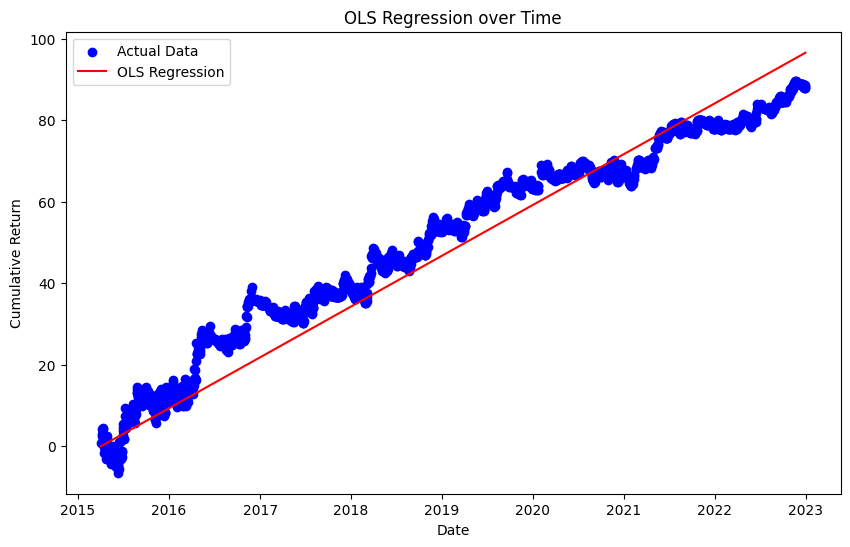

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.api import OLS
import statsmodels.api as sm

# Assuming 'data.csv' is the file containing your data
df = pd.read_csv('df.csv')

# Convert the 'date' column to datetime
df['date'] = pd.to_datetime(df['date'])

# Set the 'date' column as the index of the DataFrame
df.set_index('date', inplace=True)

# Create a numeric representation of the datetime for regression (e.g., number of days since the start)
df['time_delta'] = (df.index - df.index[0]).days

# Define the dependent variable (y) and the independent variable (x)
y = df['cumreturn']
X = df[['time_delta']]

# Add a constant to the independent variable
# X = sm.add_constant(X)

# Fit the OLS model
model = OLS(y, X).fit()

# Make predictions
df['predictions'] = model.predict(X)

# Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(df.index, y, label='Actual Data', color='blue')
plt.plot(df.index, df['predictions'], label='OLS Regression', color='red')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.title('OLS Regression over Time')
plt.legend()
plt.show()

2024-05-15 10:53:51.559524	开始加载历史数据
2024-05-15 10:53:51.559524	加载进度：# [0%]
2024-05-15 10:53:55.414790	加载进度：# [10%]
2024-05-15 10:53:59.088112	加载进度：## [20%]
2024-05-15 10:54:02.299788	加载进度：### [30%]
2024-05-15 10:54:05.884853	加载进度：#### [40%]
2024-05-15 10:54:09.129775	加载进度：##### [50%]
2024-05-15 10:54:12.820516	加载进度：###### [60%]
2024-05-15 10:54:15.868234	加载进度：####### [70%]
2024-05-15 10:54:18.917168	加载进度：######## [80%]
2024-05-15 10:54:22.453598	加载进度：######### [90%]
2024-05-15 10:54:25.978776	加载进度：########## [100%]
2024-05-15 10:54:25.988778	历史数据加载完成，数据量：695235
2024-05-15 10:54:26.083379	策略初始化完成
2024-05-15 10:54:26.083379	开始回放历史数据
2024-05-15 10:54:26.480982	回放进度：= [0%]
2024-05-15 10:54:26.870576	回放进度：== [10%]
2024-05-15 10:54:27.253308	回放进度：=== [20%]
2024-05-15 10:54:27.645992	回放进度：==== [30%]
2024-05-15 10:54:28.056910	回放进度：===== [40%]
2024-05-15 10:54:28.433149	回放进度：====== [50%]
2024-05-15 10:54:28.801790	回放进度：======= [60%]
2024-05-15 10:54:29.162151	回放进度：======== [70%]
2024-05-15 10:

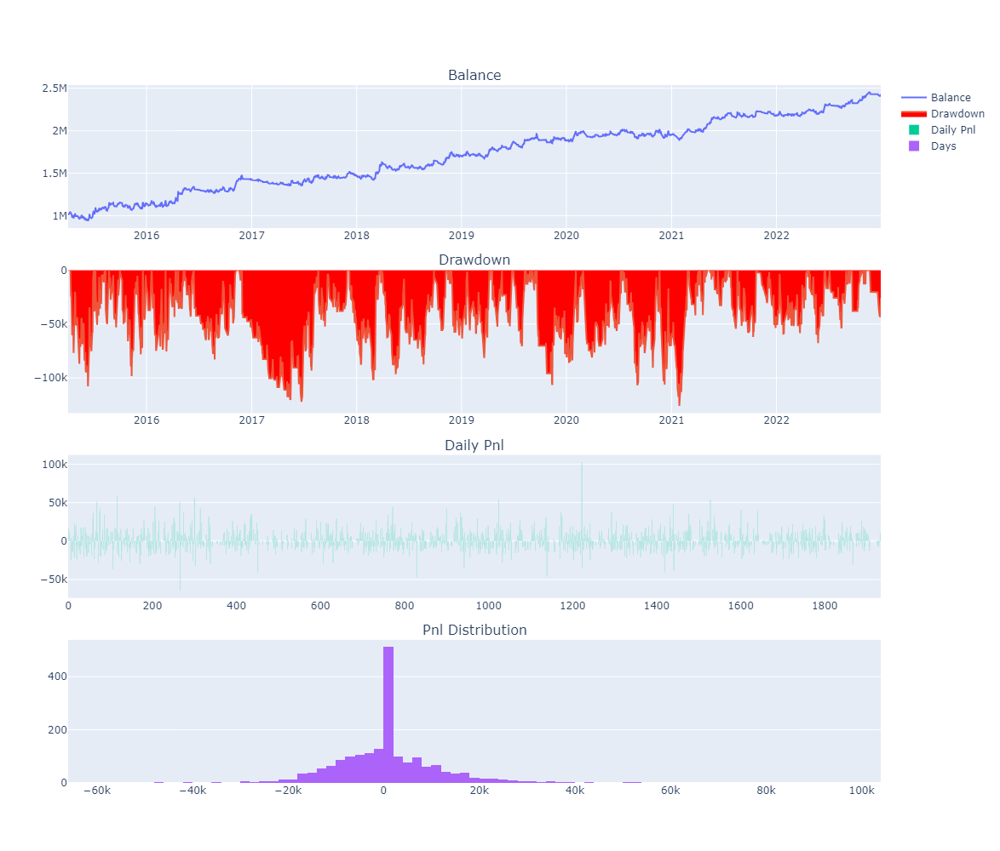

In [1]:
# 用最优参数回测
from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy

engine = BacktestingEngineNewStatistics()

engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)
setting = {
    "fast_window": 2,
    "slow_window": 40,
    "rumi_window": 20,
    "trailing_percent": 0.01,
    "K_window": 30,
    "max_holding_window": 100
}

engine.add_strategy(RumiStrategy, setting)
engine.load_data()
engine.run_backtesting()
result = engine.calculate_result()
engine.calculate_statistics()
engine.show_chart()


# 优化R-Cubed时遇到问题
根据柯蒂斯书中给定的公式:
$$
R \text {-cubed }=\frac{\text{regressed annual return}}{\text { average ( top dropdowns) } \times \text { average (top dropdown_lengths) }} \times 365
$$

优化得到的前几组解, 都不是最好的, 具体查看如下

In [1]:
# optimization - find max r_cubed_ratio
from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
from vnpy.trader.optimize import OptimizationSetting

engine = BacktestingEngineNewStatistics()

engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

engine.ddpercent_only = False 
# ddpercent_only是一个控制开关, 其值为Flase时,使用柯蒂斯原公式. 其值为True, 使用公式 regressed_annual_return / average dropdowns 代替.

setting = {
    "fast_window": 6,
    "slow_window": 100,
    "rumi_window": 10,
    "trailing_percent": 0.01,
    "K_window": 30,
    "max_holding_window": 80
}

engine.add_strategy(RumiStrategy, setting)

optimizationsetting = OptimizationSetting()
# optimizationsetting.add_parameter("K_window", 30, 40, 10)
optimizationsetting.add_parameter("fast_window", 2, 10, 2)
optimizationsetting.add_parameter("slow_window", 20, 100, 20)
optimizationsetting.add_parameter("rumi_window", 10, 20, 2)
optimizationsetting.add_parameter("trailing_percent", 0.01, 0.05, 0.01)
optimizationsetting.add_parameter("max_holding_window", 50, 100, 10)

optimizationsetting.set_target("r_cubed_ratio")
result = engine.run_bf_optimization(optimizationsetting)

2024-05-12 15:57:17.428480	开始执行穷举算法优化
2024-05-12 15:57:17.429480	参数优化空间：4500


100%|██████████████████████████████████████████████████████████████████████████████| 4500/4500 [48:58<00:00,  1.53it/s]


2024-05-12 16:46:16.950009	穷举算法优化完成，耗时2939秒
2024-05-12 16:46:25.655519	参数：{'fast_window': 8, 'slow_window': 80, 'rumi_window': 20, 'trailing_percent': 0.01, 'max_holding_window': 100}, 目标：7.9741373607530575
2024-05-12 16:46:25.655519	参数：{'fast_window': 4, 'slow_window': 100, 'rumi_window': 18, 'trailing_percent': 0.01, 'max_holding_window': 100}, 目标：6.7884646521555725
2024-05-12 16:46:25.655519	参数：{'fast_window': 8, 'slow_window': 100, 'rumi_window': 20, 'trailing_percent': 0.02, 'max_holding_window': 90}, 目标：6.563521655805343
2024-05-12 16:46:25.655519	参数：{'fast_window': 8, 'slow_window': 100, 'rumi_window': 16, 'trailing_percent': 0.01, 'max_holding_window': 100}, 目标：6.480636204910915
2024-05-12 16:46:25.656519	参数：{'fast_window': 10, 'slow_window': 100, 'rumi_window': 18, 'trailing_percent': 0.02, 'max_holding_window': 100}, 目标：6.338142742505981
2024-05-12 16:46:25.656519	参数：{'fast_window': 10, 'slow_window': 100, 'rumi_window': 18, 'trailing_percent': 0.02, 'max_holding_window': 70}

2024-05-13 13:48:18.112410	开始加载历史数据
2024-05-13 13:48:18.112410	加载进度：# [0%]
2024-05-13 13:48:21.993894	加载进度：# [10%]
2024-05-13 13:48:25.575949	加载进度：## [20%]
2024-05-13 13:48:28.571563	加载进度：### [30%]
2024-05-13 13:48:31.778545	加载进度：#### [40%]
2024-05-13 13:48:34.768722	加载进度：##### [50%]
2024-05-13 13:48:38.188232	加载进度：###### [60%]
2024-05-13 13:48:41.024969	加载进度：####### [70%]
2024-05-13 13:48:43.579598	加载进度：######## [80%]
2024-05-13 13:48:46.748389	加载进度：######### [90%]
2024-05-13 13:48:50.010934	加载进度：########## [100%]
2024-05-13 13:48:50.021932	历史数据加载完成，数据量：695235
2024-05-13 13:48:50.168933	策略初始化完成
2024-05-13 13:48:50.168933	开始回放历史数据
2024-05-13 13:48:50.533053	回放进度：= [0%]
2024-05-13 13:48:50.873771	回放进度：== [10%]
2024-05-13 13:48:51.237369	回放进度：=== [20%]
2024-05-13 13:48:51.582489	回放进度：==== [30%]
2024-05-13 13:48:51.921608	回放进度：===== [40%]
2024-05-13 13:48:52.264172	回放进度：====== [50%]
2024-05-13 13:48:52.614645	回放进度：======= [60%]
2024-05-13 13:48:52.960529	回放进度：======== [70%]
2024-05-13 13:

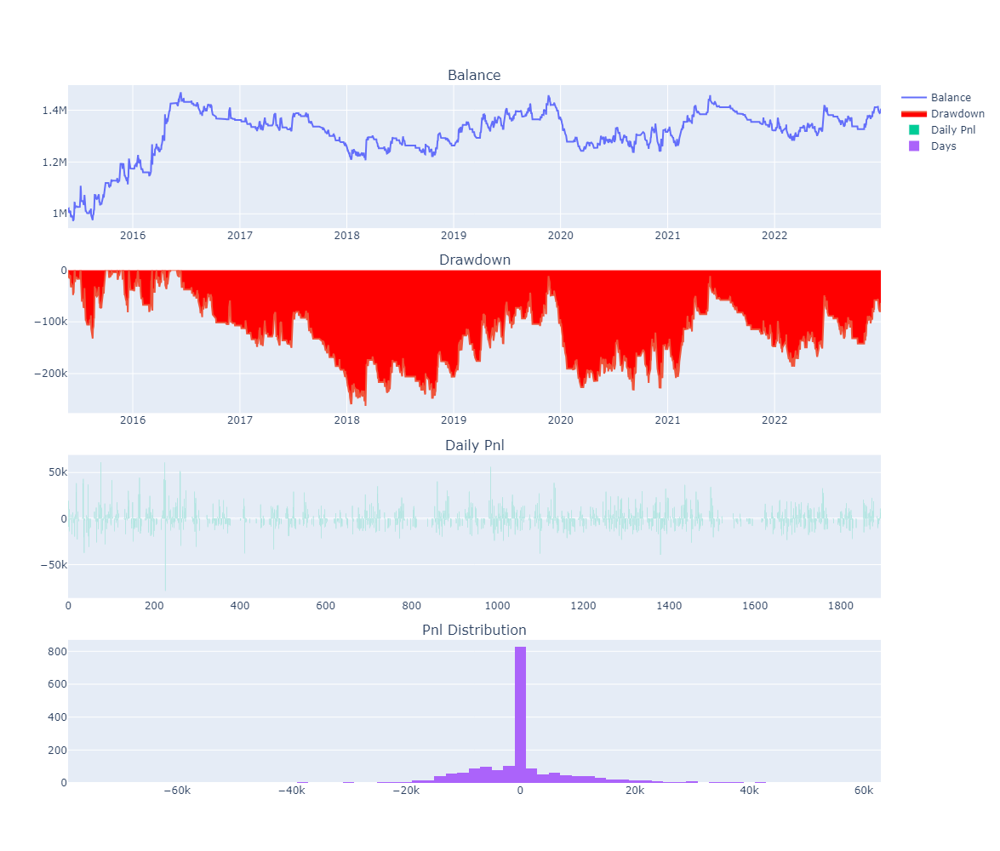

In [1]:
# 取最优参数回测

from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
from vnpy.trader.optimize import OptimizationSetting

engine = BacktestingEngineNewStatistics()
engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

engine.ddpercent_only = False
setting = {
    "fast_window": 8,
    "slow_window": 80,
    "rumi_window": 20,
    "trailing_percent": 0.01,
    "K_window": 30,
    "max_holding_window": 100
}

engine.add_strategy(RumiStrategy, setting)
engine.load_data()
engine.run_backtesting()
result = engine.calculate_result()
engine.calculate_statistics()
engine.show_chart()

## 上面的结果很明显不对劲.

无论从图形, 年化收益还是sharpe ratio的角度看, 这个回测参数都是不正确的.

但是笔者多次复查代码段落,  
从函数calculate_regressed_annual_return, find_periodic_dropdowns 到 calculate_r_cubed, 一遍遍打印排查之后仍然没有找到编程上的问题.然后在知乎文章中"【Elite量化策略实验室】RUMI策略 - 2" 细看发现, Veighna 官方给出的描述是"使用5次历史极值回撤的均值作为分母", 故笔者重新修改代码, 增加仅以平均回撤作为分母的R-cubed计算公式.

# R-Cubed (仅以平均回撤作为公式分母)

In [2]:
# find max r_cubed_ratio
from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
from vnpy.trader.optimize import OptimizationSetting

engine = BacktestingEngineNewStatistics()

engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

engine.ddpercent_only = True # 仅使用平均回撤幅度作为r-cubed分母

setting = {
    "fast_window": 6,
    "slow_window": 100,
    "rumi_window": 10,
    "trailing_percent": 0.01,
    "K_window": 30,
    "max_holding_window": 80
}

engine.add_strategy(RumiStrategy, setting)

optimizationsetting = OptimizationSetting()
# optimizationsetting.add_parameter("K_window", 30, 40, 10)
optimizationsetting.add_parameter("fast_window", 2, 10, 2)
optimizationsetting.add_parameter("slow_window", 20, 100, 20)
optimizationsetting.add_parameter("rumi_window", 10, 20, 2)
optimizationsetting.add_parameter("trailing_percent", 0.01, 0.05, 0.01)
optimizationsetting.add_parameter("max_holding_window", 50, 100, 10)

optimizationsetting.set_target("r_cubed_ratio")
result = engine.run_bf_optimization(optimizationsetting)

2024-05-10 22:39:08.977446	开始执行穷举算法优化
2024-05-10 22:39:08.977446	参数优化空间：4500


100%|██████████████████████████████████████████████████████████████████████████████| 4500/4500 [49:53<00:00,  1.50it/s]


2024-05-10 23:29:03.855938	穷举算法优化完成，耗时2994秒
2024-05-10 23:29:13.638461	参数：{'fast_window': 6, 'slow_window': 100, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 80}, 目标：1.7492575897203175
2024-05-10 23:29:13.638461	参数：{'fast_window': 6, 'slow_window': 100, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 90}, 目标：1.6667525768068796
2024-05-10 23:29:13.638461	参数：{'fast_window': 2, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 80}, 目标：1.6272019392844475
2024-05-10 23:29:13.638461	参数：{'fast_window': 8, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 80}, 目标：1.6146159422032347
2024-05-10 23:29:13.638461	参数：{'fast_window': 4, 'slow_window': 100, 'rumi_window': 12, 'trailing_percent': 0.01, 'max_holding_window': 80}, 目标：1.5880264374714643
2024-05-10 23:29:13.638461	参数：{'fast_window': 2, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 90}, 目标：

2024-05-13 13:56:14.947882	开始加载历史数据
2024-05-13 13:56:14.947882	加载进度：# [0%]
2024-05-13 13:56:14.949884	加载进度：# [10%]
2024-05-13 13:56:14.950882	加载进度：## [20%]
2024-05-13 13:56:14.950882	加载进度：### [30%]
2024-05-13 13:56:14.952885	加载进度：#### [40%]
2024-05-13 13:56:14.953888	加载进度：##### [50%]
2024-05-13 13:56:14.955885	加载进度：###### [60%]
2024-05-13 13:56:14.957882	加载进度：####### [70%]
2024-05-13 13:56:14.959881	加载进度：######## [80%]
2024-05-13 13:56:14.960883	加载进度：######### [90%]
2024-05-13 13:56:14.962887	加载进度：########## [100%]
2024-05-13 13:56:14.962887	历史数据加载完成，数据量：695235
2024-05-13 13:56:15.127577	策略初始化完成
2024-05-13 13:56:15.127577	开始回放历史数据
2024-05-13 13:56:15.498226	回放进度：= [0%]
2024-05-13 13:56:15.867387	回放进度：== [10%]
2024-05-13 13:56:16.213940	回放进度：=== [20%]
2024-05-13 13:56:16.552587	回放进度：==== [30%]
2024-05-13 13:56:16.890757	回放进度：===== [40%]
2024-05-13 13:56:17.232356	回放进度：====== [50%]
2024-05-13 13:56:17.583024	回放进度：======= [60%]
2024-05-13 13:56:17.927168	回放进度：======== [70%]
2024-05-13 13:

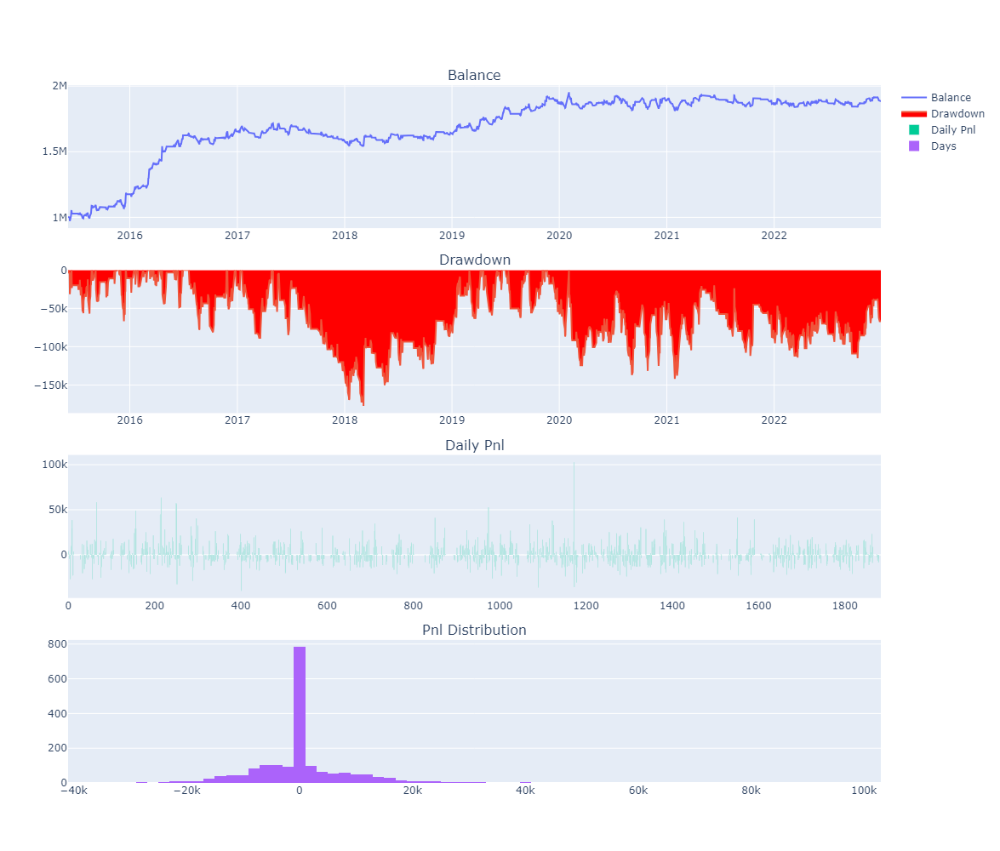

In [2]:
"""
只计算前五次回撤的平均值
"""

from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
from vnpy.trader.optimize import OptimizationSetting

engine = BacktestingEngineNewStatistics()
engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

engine.ddpercent_only = True
setting = {
    "fast_window": 6,
    "slow_window": 100,
    "rumi_window": 10,
    "trailing_percent": 0.01,
    "K_window": 30,
    "max_holding_window": 80
}

engine.add_strategy(RumiStrategy, setting)
engine.load_data()
engine.run_backtesting()
result = engine.calculate_result()
engine.calculate_statistics()
engine.show_chart()

这一看比原版的R-cubed结果更符合常理.至少年化收益, 夏普比率正常一些.

# Robust Sharpe Ratio

原书<海龟交易法则>给出的公式如下
$$
\text {robust sharpe ratio}=\frac{\text{regressed annual return}}{\text {annualised standard deviation}}
$$

In [4]:
# find max robust sharpe ratio
from datetime import datetime
from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
from vnpy.trader.optimize import OptimizationSetting

engine = BacktestingEngineNewStatistics()

engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

# engine.ddpercent_only = True # 仅使用平均回撤幅度作为r-cubed分母

setting = {
    "K_window": 30,
}

engine.add_strategy(RumiStrategy, setting)

optimizationsetting = OptimizationSetting()
# optimizationsetting.add_parameter("K_window", 30, 40, 10)
optimizationsetting.add_parameter("fast_window", 2, 10, 2)
optimizationsetting.add_parameter("slow_window", 20, 100, 20)
optimizationsetting.add_parameter("rumi_window", 10, 20, 2)
optimizationsetting.add_parameter("trailing_percent", 0.01, 0.05, 0.01)
optimizationsetting.add_parameter("max_holding_window", 50, 100, 10)

optimizationsetting.set_target("robust_sharpe_ratio")
result = engine.run_bf_optimization(optimizationsetting)


2024-05-12 19:18:59.704764	开始执行穷举算法优化
2024-05-12 19:18:59.704764	参数优化空间：4500


100%|██████████████████████████████████████████████████████████████████████████████| 4500/4500 [49:04<00:00,  1.53it/s]


2024-05-12 20:08:04.702976	穷举算法优化完成，耗时2944秒
2024-05-12 20:08:14.243229	参数：{'fast_window': 8, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 80}, 目标：1.3022482394426358
2024-05-12 20:08:14.244229	参数：{'fast_window': 8, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 90}, 目标：1.2909846988955438
2024-05-12 20:08:14.244229	参数：{'fast_window': 2, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 90}, 目标：1.2005647421083663
2024-05-12 20:08:14.244229	参数：{'fast_window': 6, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.01, 'max_holding_window': 90}, 目标：1.1921580813652086
2024-05-12 20:08:14.244229	参数：{'fast_window': 8, 'slow_window': 80, 'rumi_window': 10, 'trailing_percent': 0.02, 'max_holding_window': 90}, 目标：1.1874142528276994
2024-05-12 20:08:14.244229	参数：{'fast_window': 8, 'slow_window': 60, 'rumi_window': 14, 'trailing_percent': 0.02, 'max_holding_window': 90}, 目标：1.1

2024-05-13 13:58:13.218646	开始加载历史数据
2024-05-13 13:58:13.218646	加载进度：# [0%]
2024-05-13 13:58:13.219646	加载进度：# [10%]
2024-05-13 13:58:13.220646	加载进度：## [20%]
2024-05-13 13:58:13.221650	加载进度：### [30%]
2024-05-13 13:58:13.222650	加载进度：#### [40%]
2024-05-13 13:58:13.224648	加载进度：##### [50%]
2024-05-13 13:58:13.226648	加载进度：###### [60%]
2024-05-13 13:58:13.229646	加载进度：####### [70%]
2024-05-13 13:58:13.232649	加载进度：######## [80%]
2024-05-13 13:58:13.234652	加载进度：######### [90%]
2024-05-13 13:58:13.237648	加载进度：########## [100%]
2024-05-13 13:58:13.237648	历史数据加载完成，数据量：695235
2024-05-13 13:58:13.379646	策略初始化完成
2024-05-13 13:58:13.379646	开始回放历史数据
2024-05-13 13:58:13.764468	回放进度：= [0%]
2024-05-13 13:58:14.130465	回放进度：== [10%]
2024-05-13 13:58:14.476647	回放进度：=== [20%]
2024-05-13 13:58:14.820380	回放进度：==== [30%]
2024-05-13 13:58:15.165936	回放进度：===== [40%]
2024-05-13 13:58:15.512541	回放进度：====== [50%]
2024-05-13 13:58:15.859758	回放进度：======= [60%]
2024-05-13 13:58:16.203305	回放进度：======== [70%]
2024-05-13 13:

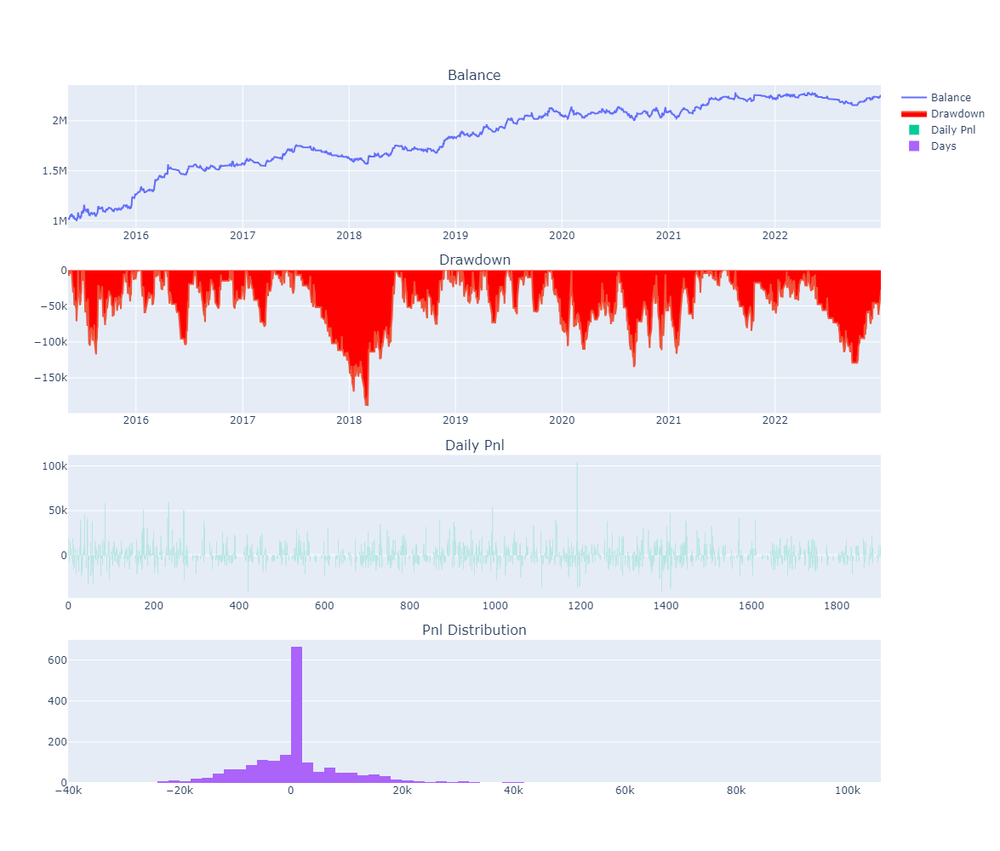

In [3]:
# 回测找到的最优robust sharpe ratio参数
from datetime import datetime

from backtesting_engine_new_statistics import BacktestingEngineNewStatistics
from vnpy.trader.object import Interval
from rumi import RumiStrategy
engine = BacktestingEngineNewStatistics()

engine.set_parameters(
    vt_symbol = "rb99.SHFE",
    interval = Interval.MINUTE,
    start = datetime(2015, 1, 1),
    end = datetime(2023, 1, 1),
    rate = 0.0001,
    slippage = 1,
    size = 10,
    pricetick = 1,
    capital = 1000000,
)

setting = {
    "fast_window": 8,
    "slow_window": 80,
    "rumi_window": 10,
    "trailing_percent": 0.01,
    "K_window": 30,
    "max_holding_window": 80
}

engine.add_strategy(RumiStrategy, setting)
engine.load_data()
engine.run_backtesting()
result = engine.calculate_result()
engine.calculate_statistics()
engine.show_chart()